In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


class TrafficSignDetector:
    def __init__(self, images_dir, train_images_dir):
        """
        Initialize the TrafficSignDetector with directories for images.

        :param images_dir: Path to the root image directory
        :param train_images_dir: Path to the training images subdirectory
        """
        self.images_dir = images_dir
        self.train_images_dir = train_images_dir

        # Placeholder for image dimensions and processing steps
        self.height = None
        self.width = None
        self.gray_image = None
        self.histofram_eq_image = None
        self.blurred_image = None
        self.thresholded_image = None
        self.edges = None
        self.eroded_image = None
        self.filtered_components = None
        self.output_image = None
        self.circles = None
        self.detected_plates = []

    def process_image(self, image_name):
        """
        Process an image through the detection pipeline.
        
        :param image_name: Filename of the image to process
        """
        # 1. Load and convert to grayscale
        image_path = os.path.join(self.images_dir, self.train_images_dir, image_name)
        self.gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        self.height, self.width = self.gray_image.shape
        

        # 2. Gaussian blur
        kernel_size = (self.width // 40, self.height // 40)  # Relative kernel size
        kernel_size = (max(3, kernel_size[0] | 1), max(3, kernel_size[1] | 1))  # Ensure odd size
        self.blurred_image = cv2.GaussianBlur(self.gray_image, kernel_size, 0.)

        

        # 3. Thresholding
        self.thresholded_image = cv2.adaptiveThreshold(
                self.blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 13, 2
                )

        
        # 4. Edge detection

        #make self.edges the negatice of the self.thresholded_image
        self.edges = cv2.bitwise_not(self.thresholded_image)
        
        
        # Connected components analysis
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(self.edges, 8, cv2.CV_32S)
        self.connected_component_image = labels.copy()
        self.filtered_components = np.zeros(self.edges.shape, dtype=np.uint8)
        for i in range(1, num_labels):
            if stats[i, cv2.CC_STAT_AREA] > 1000:
                self.filtered_components[labels == i] = 255
                

        # 5. Morphological operations
        kernel_size = (self.width // 100, self.height // 100)  # Relative kernel size
        kernel_size = (max(3, kernel_size[0]), max(3, kernel_size[1]))  # Ensure minimum size
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
        dilated_image =   cv2.dilate(self.filtered_components, kernel, iterations=1)
        self.eroded_image = cv2.erode(dilated_image, kernel, iterations=1)


        # 6. Circle detection (Hough Transform)
        min_radius = min(self.height // 12, self.width // 12)  # Relative to image height
        max_radius = max(self.height // 2, self.width // 2)
        self.circles = cv2.HoughCircles(
            self.eroded_image,
            cv2.HOUGH_GRADIENT_ALT,
            dp=1,
            minDist=min(self.height // 20, self.width // 20),
            param1=50,
            param2=0.6,
            minRadius=min_radius,
            maxRadius=max_radius,
        )

        # 7. Remove overlapping circles
        self.remove_overlapping_circles()

        # 8. Draw detected circles and extract plates
        self.output_image = cv2.cvtColor(self.gray_image, cv2.COLOR_GRAY2BGR)
        if self.circles is not None:
            self.circles = np.uint16(np.around(self.circles))
            for circle in self.circles[0, :]:
                x, y, r = circle
                cv2.circle(self.output_image, (x, y), r, (0, 255, 0), 2)
                cropped_plate = self.gray_image[max(0, y - r) : min(self.height, y + r), max(0, x - r) : min(self.width, x + r)]
                self.detected_plates.append(cropped_plate)

    def remove_overlapping_circles(self, overlap_threshold=0.3):
        """
        Remove overlapping circles from the list based on a threshold.

        :param overlap_threshold: The minimum overlap ratio to consider two circles as overlapping
        """
        if self.circles is not None:
            valid_circles = []
            for i, circle1 in enumerate(self.circles[0, :]):
                x1, y1, r1 = circle1
                is_overlapping = False
                
                # If valid_circles is empty, we can add the first circle directly
                if len(valid_circles) == 0:
                    valid_circles.append(circle1)
                    continue
                
                for circle2 in valid_circles:
                    x2, y2, r2 = circle2
                    # Calculate distance between centers
                    distance = np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)
                    print(x1, y1, r1, x2, y2, r2, distance)
                    # Check if the circles overlap more than the threshold
                    print(distance, (r1 + r2) * (1 - overlap_threshold))
                    if distance < (r1 + r2) * (1 - overlap_threshold):
                        is_overlapping = True
                        break

                if not is_overlapping:
                    valid_circles.append(circle1)
            
            # Update self.circles with the filtered non-overlapping circles
            self.circles = np.array([valid_circles], dtype=np.uint16)


    def visualize_results(self):
        """
        Visualize intermediate results and detected plates.
        """
        titles = [
            "Original Image",
            "Gaussian Blur",
            "Thresholded Image",
            "Edges",
            "Connected Components",
            "Filtered Components",
            "Morphological Image",
            "Detected Circles",
        ]
        images = [
            self.gray_image,
            self.blurred_image,
            self.thresholded_image,
            self.edges,
            self.connected_component_image,
            self.filtered_components ,
            self.eroded_image,
            self.output_image,
        ]

        plt.figure(figsize=(20, 10))
        for i, (title, img) in enumerate(zip(titles, images), 1):
            if img is not None:
                plt.subplot(2, 4, i)
                plt.title(title)
                cmap = "gray" if len(img.shape) == 2 else None
                plt.imshow(img, cmap=cmap)
                #plt.axis("off")

        # Visualize detected plates
        for i, plate in enumerate(self.detected_plates, 1):
            plt.figure(figsize=(5, 5))
            plt.title(f"Detected Plate {i}")
            plt.imshow(plate, cmap="gray")
            #plt.axis("off")
            plt.show()

        plt.tight_layout()
        plt.show()


libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


544.0 325.0 126.24792 544.0 325.0 139.68973 0.0
0.0 186.15636


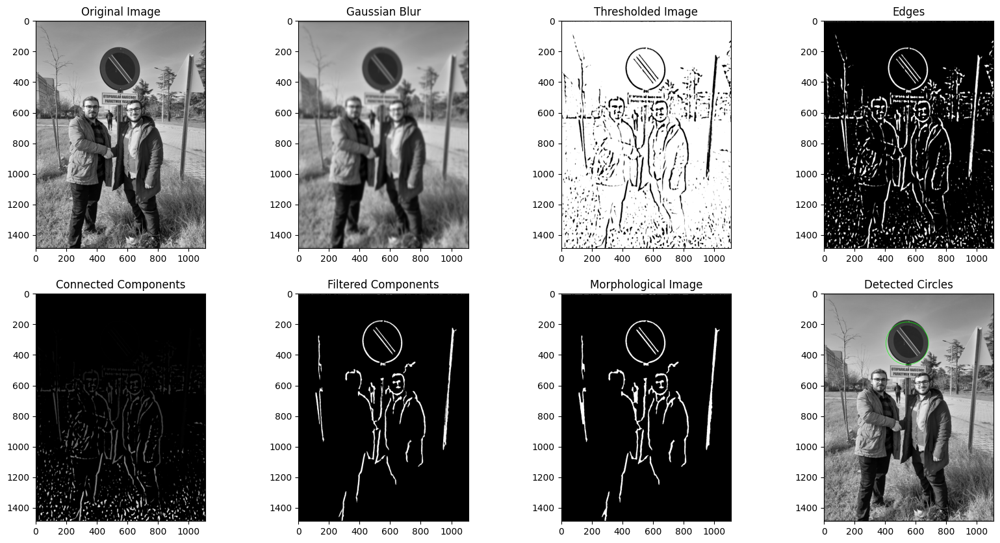

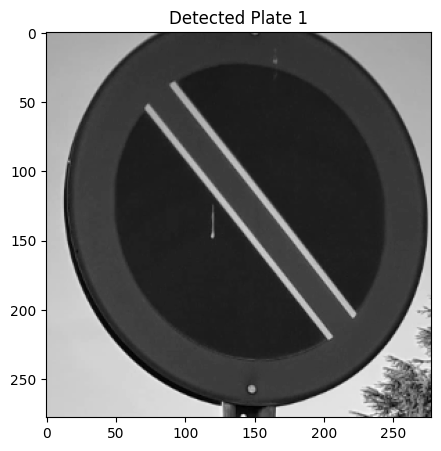

<Figure size 640x480 with 0 Axes>

In [38]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_hard_1.png")
detector.visualize_results()

91.0 75.0 33.99805 80.0 72.0 44.596245 11.401754
11.401754 55.01601


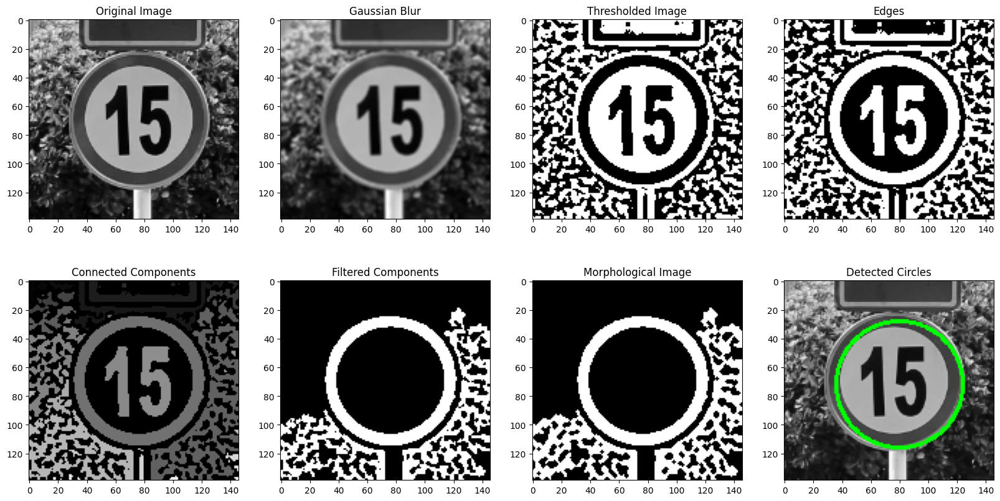

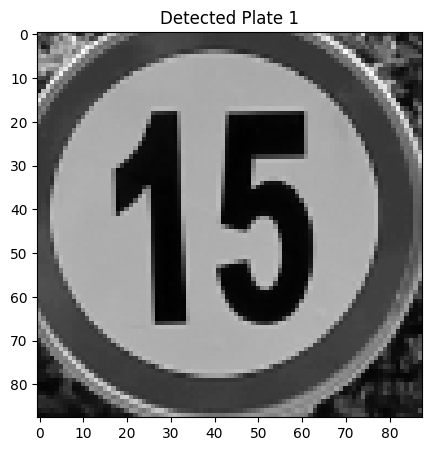

<Figure size 640x480 with 0 Axes>

In [18]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_easy_2.png")
detector.visualize_results()

77.0 80.0 43.64229 77.0 80.0 55.442665 0.0
0.0 69.35947
70.0 101.0 37.921295 77.0 80.0 55.442665 22.135944
22.135944 65.354774
70.0 101.0 23.194836 77.0 80.0 55.442665 22.135944
22.135944 55.046246


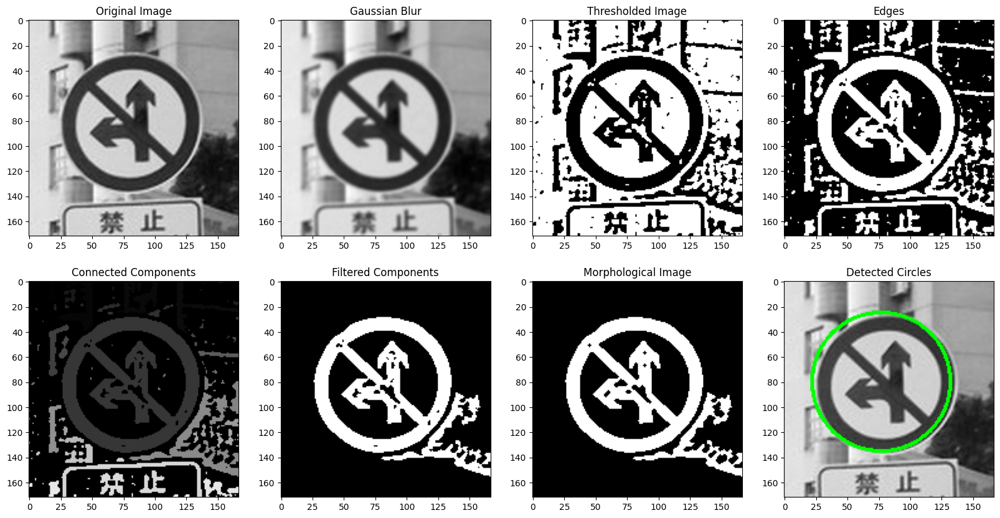

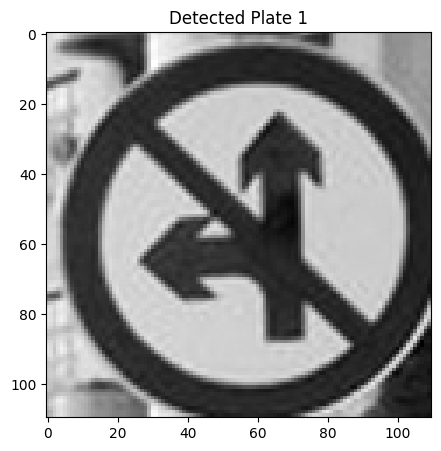

<Figure size 640x480 with 0 Axes>

In [19]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_easy_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


417.0 276.0 226.6125 417.0 276.0 196.12212 0.0
0.0 295.9142


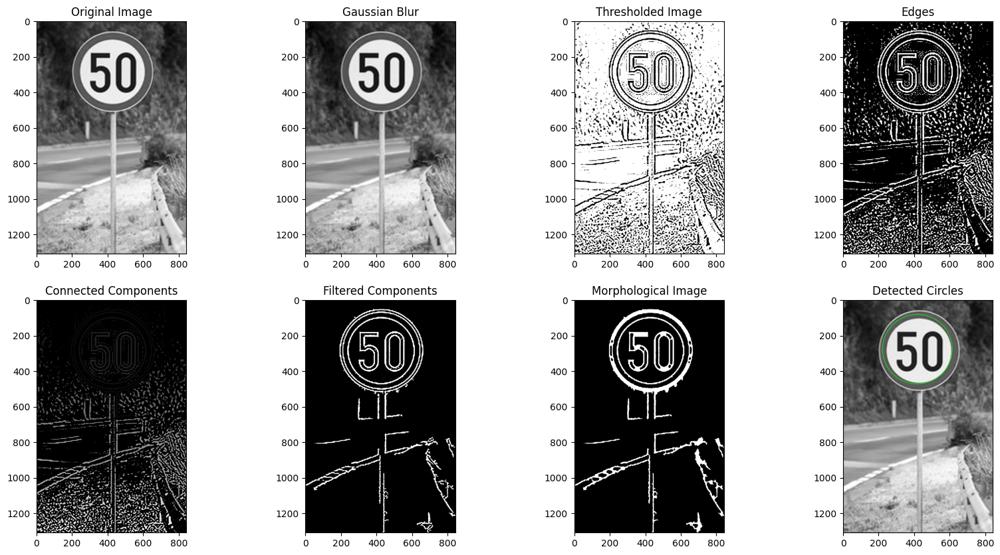

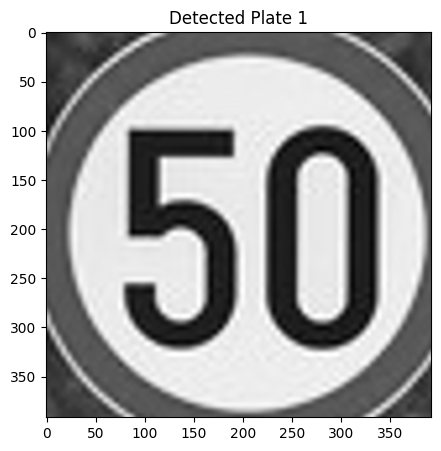

<Figure size 640x480 with 0 Axes>

In [20]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_middle_1.png")
detector.visualize_results()

171.0 149.0 92.589485 171.0 149.0 82.06674 0.0
0.0 122.25935
171.0 149.0 49.552803 171.0 149.0 82.06674 0.0
0.0 92.133675


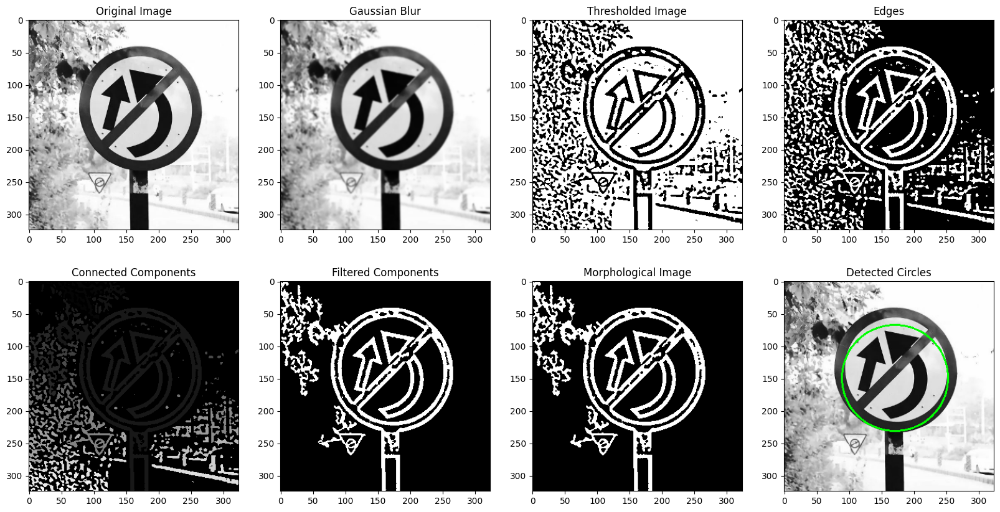

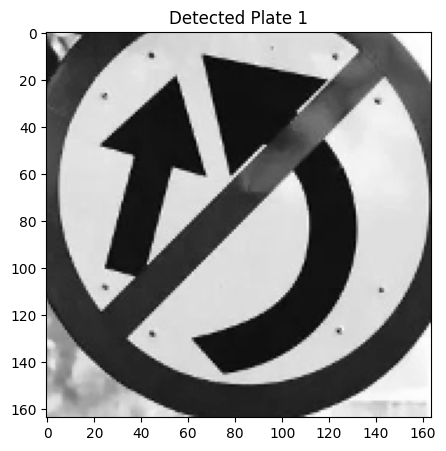

<Figure size 640x480 with 0 Axes>

In [21]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_middle_2.png")
detector.visualize_results()

# Test

207.0 181.0 136.54433 188.0 174.0 152.95963 20.248457
20.248457 202.65277
188.0 174.0 124.336205 188.0 174.0 152.95963 0.0
0.0 194.10709


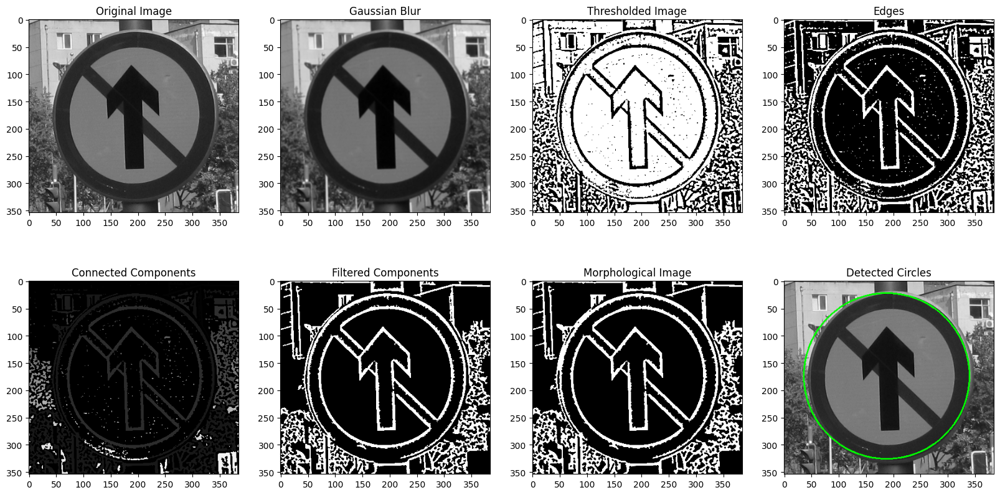

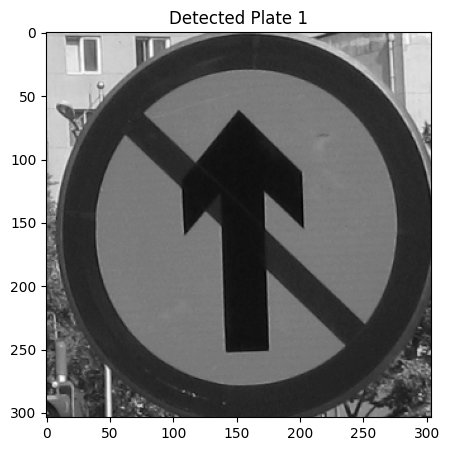

<Figure size 640x480 with 0 Axes>

In [22]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_easy_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


699.0 296.0 206.30951 247.0 317.0 209.55768 452.48758
452.48758 291.10703
247.0 317.0 158.66113 247.0 317.0 209.55768 0.0
0.0 257.75317
221.0 773.0 193.69035 247.0 317.0 209.55768 456.74063
456.74063 282.27362
221.0 773.0 193.69035 699.0 296.0 206.30951 675.28735
675.28735 279.9999
724.0 767.0 231.53654 247.0 317.0 209.55768 655.766
655.766 308.76596
724.0 767.0 231.53654 699.0 296.0 206.30951 471.66302
471.66302 306.49225
724.0 767.0 231.53654 221.0 773.0 193.69035 503.0358
503.0358 297.6588
724.0 767.0 205.68007 247.0 317.0 209.55768 655.766
655.766 290.6664
724.0 767.0 205.68007 699.0 296.0 206.30951 471.66302
471.66302 288.3927
724.0 767.0 205.68007 221.0 773.0 193.69035 503.0358
503.0358 279.5593
724.0 767.0 205.68007 724.0 767.0 231.53654 0.0
0.0 306.05164


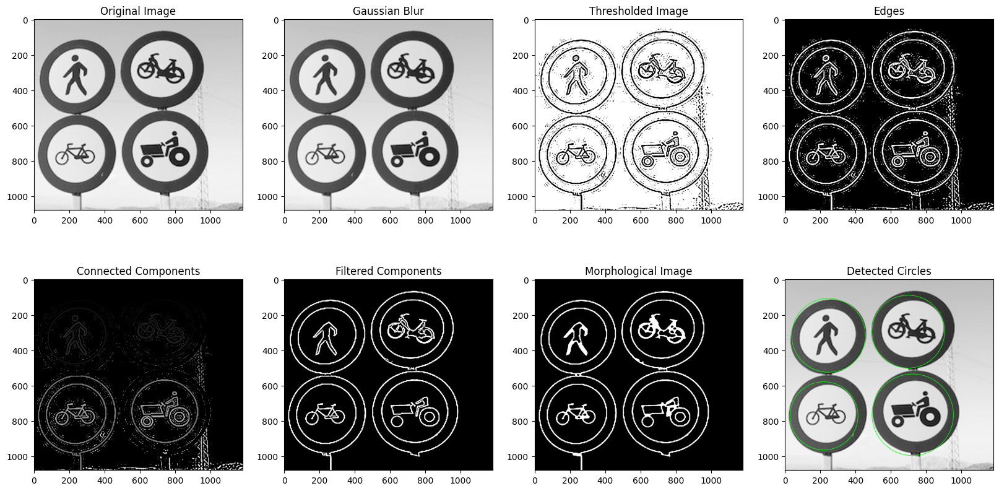

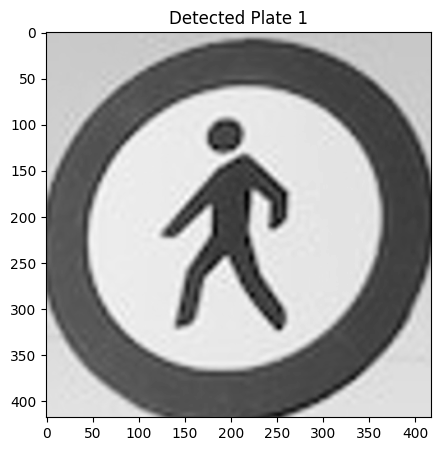

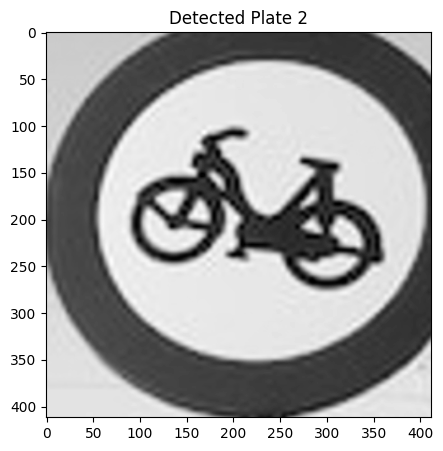

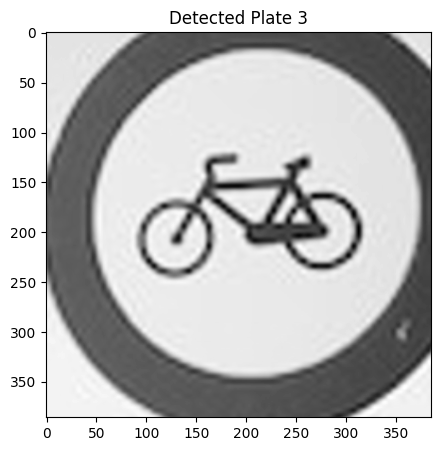

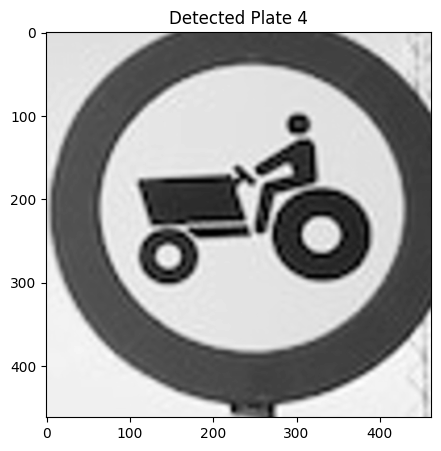

<Figure size 640x480 with 0 Axes>

In [23]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_easy_2.png")
detector.visualize_results()

871.0 284.0 128.23648 871.0 284.0 153.3461 0.0
0.0 197.1078


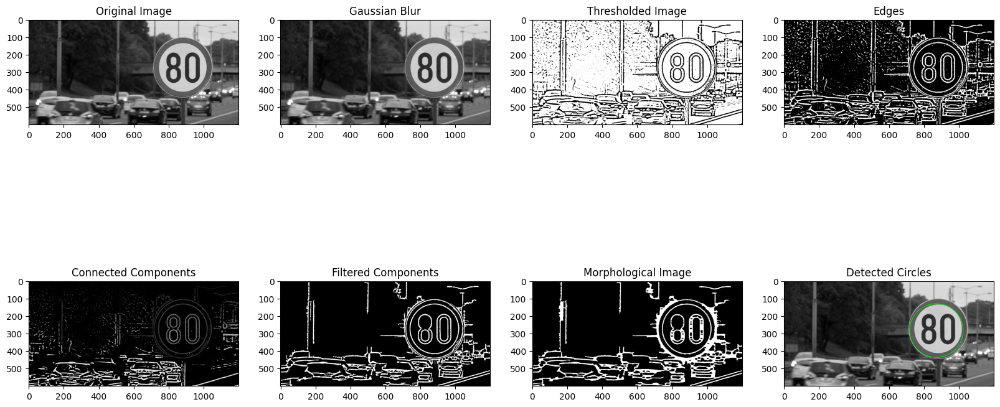

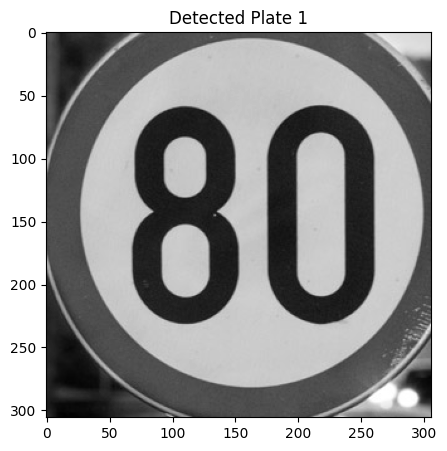

<Figure size 640x480 with 0 Axes>

In [24]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_middle_1.png")
detector.visualize_results()

425.0 743.0 146.66672 425.0 743.0 186.01923 0.0
0.0 232.88016


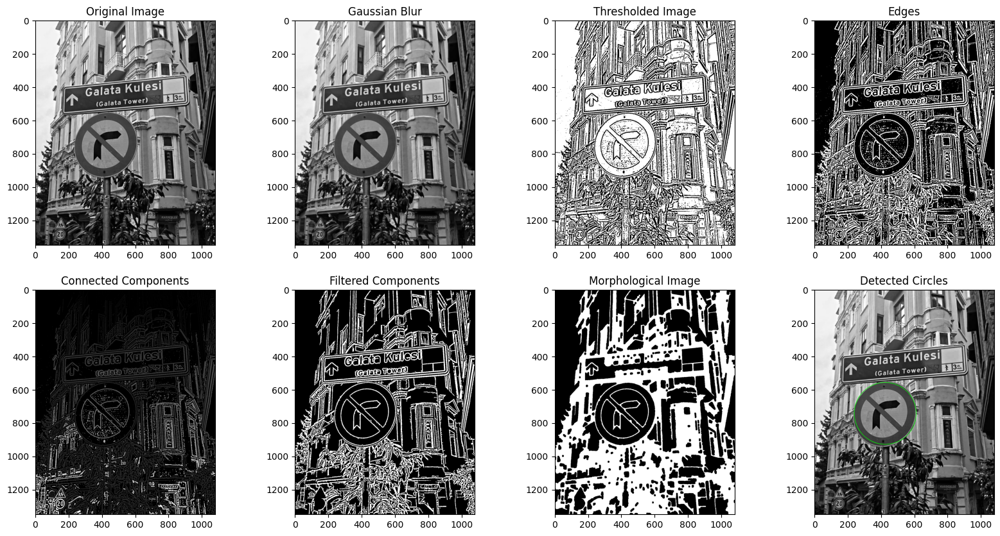

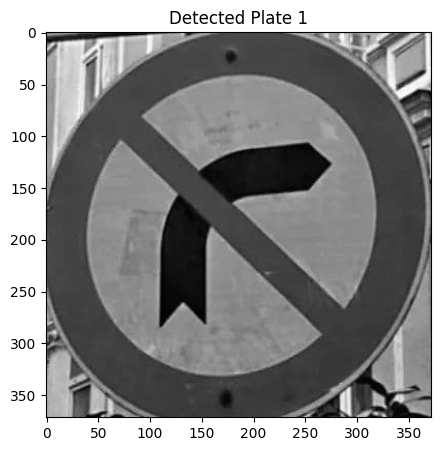

<Figure size 640x480 with 0 Axes>

In [25]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_middle_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


574.0 110.0 40.264675 574.0 110.0 49.287292 0.0
0.0 62.68638


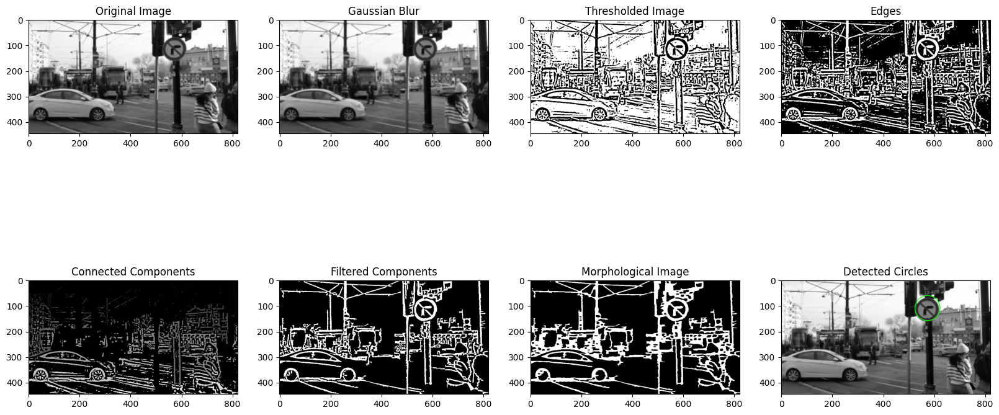

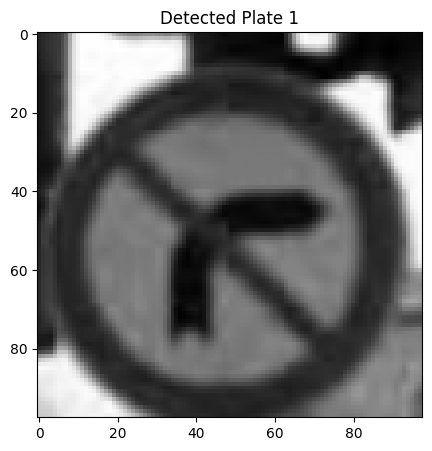

<Figure size 640x480 with 0 Axes>

In [26]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_hard_1.png")
detector.visualize_results()

[ WARN:0@1233.291] global loadsave.cpp:241 findDecoder imread_('images_gray/train/train_easy_3.png'): can't open/read file: check file path/integrity
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


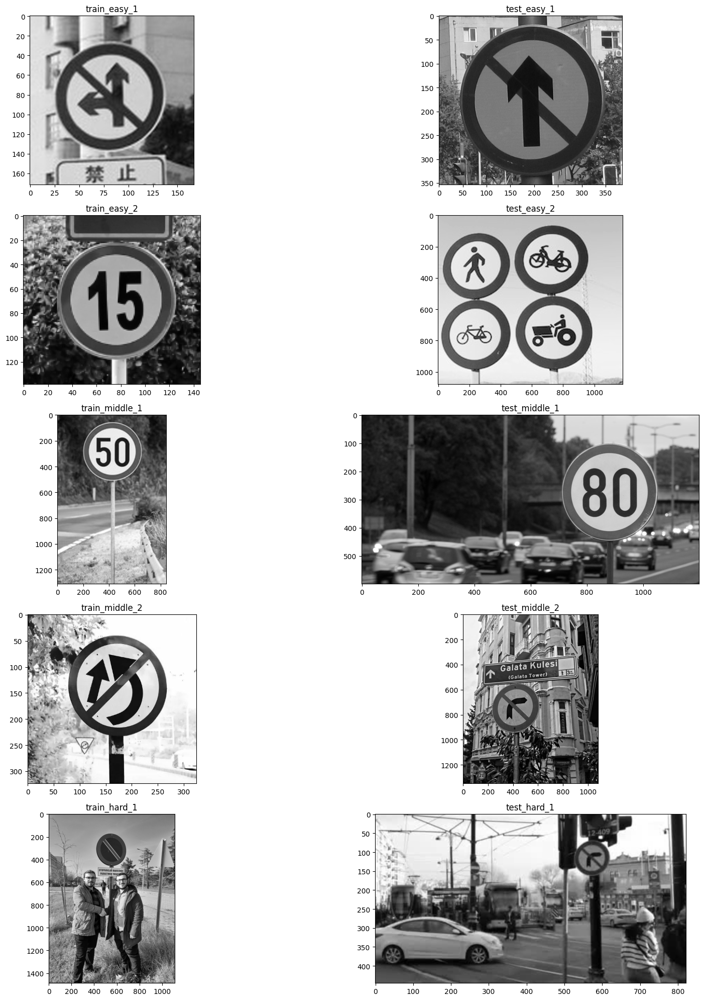

In [14]:
# Define the images and their titles
images = [
    "train_easy_1",
    "test_easy_1",
    "train_easy_2",
    "test_easy_2", 
    "train_middle_1",
    "test_middle_1", 
    "train_middle_2",
    "test_middle_2", 
    "train_hard_1",
    "test_hard_1",
]

# Load all 
train_easy_1_img = cv2.imread("images_gray/train/train_easy_1.png", cv2.IMREAD_GRAYSCALE)
train_easy_3_img = cv2.imread("images_gray/train/train_easy_3.png", cv2.IMREAD_GRAYSCALE)
train_middle_1_img = cv2.imread("images_gray/train/train_middle_1.png", cv2.IMREAD_GRAYSCALE)
train_middle_2_img = cv2.imread("images_gray/train/train_middle_2.png", cv2.IMREAD_GRAYSCALE)
train_hard_1_img = cv2.imread("images_gray/train/train_hard_1.png", cv2.IMREAD_GRAYSCALE)
test_easy_1_img = cv2.imread("images_gray/test/test_easy_1.png", cv2.IMREAD_GRAYSCALE)
test_easy_2_img = cv2.imread("images_gray/test/test_easy_2.png", cv2.IMREAD_GRAYSCALE)
test_middle_1_img = cv2.imread("images_gray/test/test_middle_1.png", cv2.IMREAD_GRAYSCALE)
test_middle_2_img = cv2.imread("images_gray/test/test_middle_2.png", cv2.IMREAD_GRAYSCALE)
test_hard_1_img = cv2.imread("images_gray/test/test_hard_1.png", cv2.IMREAD_GRAYSCALE)

# Plot all images using a for loop
plt.figure(figsize=(20, 20))
for image in images:
    idx = images.index(image) + 1
    title = image
    img = cv2.imread(f"images_gray/train/{image}.png", cv2.IMREAD_GRAYSCALE) if "train" in image \
            else cv2.imread(f"images_gray/test/{image}.png", cv2.IMREAD_GRAYSCALE)
    plt.subplot(5, 2, idx)
    plt.title(title)
    plt.imshow(img, cmap="gray")

plt.tight_layout()
plt.show()
